---
title: Fig. 1 - Standard Analyses
author: Benjamin Doran
date: today
---

In [1]:
#| code-summary: Julia library setup
#| code-fold: true
using DrWatson
@quickactivate projectdir()

using CSV, DataFrames, Muon
using Random: seed!
using UMAP, Distances

using LinearAlgebra, StatsBase

using SpectralInference # shh... I haven't explained what this is yet

using StatsPlots
theme(:default, grid=false, tickdir=:out, label=false)
include(srcdir("helpers.jl"))

bbdir = datadir("exp_raw", "BB669");
tdir_16S = projectdir("_research", "BB669_16S_phyml")
tdir_bac120 = projectdir("_research", "BB669_bac120_phyml")
pdir_16S = plotsdir("BB669_16Strees") |> mkpath
pdir_bac120 = plotsdir("BB669_bac120trees") |> mkpath;

In [34]:
#| code-summary: R library setup
#| code-fold: true
#| output: false
import CondaPkg
CondaPkg.activate!(ENV)
using RCall
@show readlines(`which R`)
R"""
library(ape)
library(treeio)
library(ggtree)
library(ggplot2)
library(tidyverse)
library(tidytree)

setwd($(projectdir()))
""";

readlines(`which R`) = ["/Users/bend/projects/Doran_etal_2023/.CondaPkg/env/bin/R"]


# Main - Standard analysis

This notebook gives context for what strains are in our strain bank and shows that standard analyses don't work for capturing genomic strain variation.

In [3]:
# read in data
biobank = readh5mu(joinpath(bbdir, "BB669.h5mu"))
biobank.obs[!,:kept_species] = convert.(Bool,biobank.obs[!,:kept_species]);
biobank

┌ Warning: Cannot join columns with the same name because var_names are intersecting.
└ @ Muon /Users/bend/.julia/packages/Muon/UKjAF/src/mudata.jl:367


MuData object 669 ✕ 21475
└ metabolites_foldchange
  AnnData object 669 ✕ 50
└ oggs
  AnnData object 669 ✕ 11248
└ UPorder_oggs
  AnnData object 669 ✕ 10177

In [4]:
# we have taxanomic information each of these strains
# GTDB_* are the annotations from https://gtdb.ecogenomic.org/
# NCBI_* are the annotation post-submission to NCBI
# * annotations are pre-submission to NCBI
# donor specifies which human microbiome each strain was sampled from
#       <hospital>.<donor number>
bbobs = biobank.obs;
first(bbobs, 5)

Row,Strain_ID,Accession,Phylum,Class,Order,Family,Genus,Species,Donor,NCBI_Phylum,NCBI_Class,NCBI_Order,NCBI_Family,NCBI_Genus,NCBI_Species,GTDB_Phylum,GTDB_Class,GTDB_Order,GTDB_Family,GTDB_Genus,GTDB_Species,kept_species
,String,String,String,String,String,String,String,String,String,String,String,String,String,String,String,String,String,String,String,String,String,Bool
1,MSK.16.19,JAHOLG000000000,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides eggerthii,MSK.16,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides eggerthii,Bacteroidota,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides eggerthii,false
2,MSK.10.5,JAHOMY000000000,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides fragilis,MSK.10,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides fragilis,Bacteroidota,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides fragilis_A,false
3,MSK.13.23,JAHOMK000000000,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides fragilis,MSK.13,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides fragilis,Bacteroidota,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides fragilis_A,false
4,MSK.16.61,JAHOKD000000000,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Phocaeicola,Phocaeicola vulgatus,MSK.16,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Phocaeicola,Phocaeicola vulgatus,Bacteroidota,Bacteroidia,Bacteroidales,Bacteroidaceae,Phocaeicola,Phocaeicola vulgatus,true
5,MSK.18.56,JAHOHX000000000,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides caccae,MSK.18,Bacteroidetes,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides caccae,Bacteroidota,Bacteroidia,Bacteroidales,Bacteroidaceae,Bacteroides,Bacteroides caccae,false


In [5]:
# concentrated for lachno's and bacteroidaceae 
# (matches distibutions normally found in these types of strain bank)
family_counts = sort(countmap(bbobs.NCBI_Family), byvalue=true, rev=true)

OrderedCollections.OrderedDict{String, Int64} with 12 entries:
  "Lachnospiraceae"              => 347
  "Bacteroidaceae"               => 229
  "Bifidobacteriaceae"           => 30
  "Tannerellaceae"               => 21
  "Prevotellaceae"               => 14
  "Rikenellaceae"                => 9
  "Erysipelotrichaceae"          => 5
  "<unclassified>"               => 4
  "Oscillospiraceae"             => 4
  "Odoribacteraceae"             => 4
  "Enterobacteriaceae"           => 1
  "Eubacteriales incertae sedis" => 1

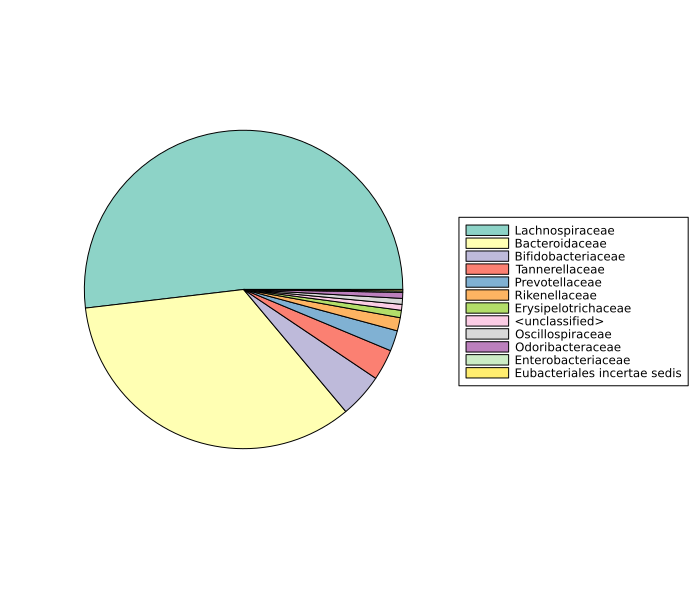

In [6]:
#| fig-cap: proportion CSB strains from different NCBI families
pie(family_counts, 
    c=palette(:Set3_12),
    legend=:outerright,
    size=(700,600),
)

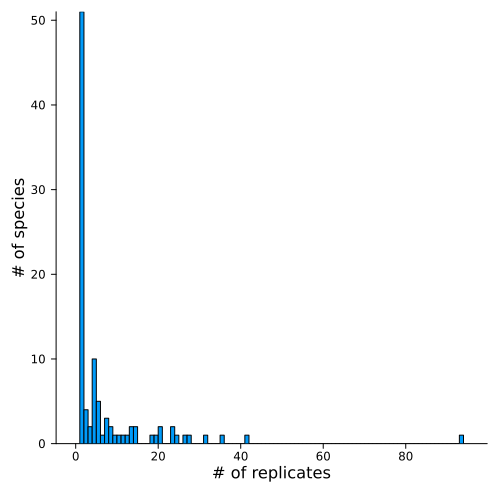

In [7]:
#| fig-cap: each bar represents the number of measured species (y axis) with a certain number of replicates (x axis). Most species we classify only have 1 strain representative, 11 species have at least 20 strain representatives.
species_counts = collect(values(countmap(bbobs.NCBI_Species)));
histogram(
    species_counts, 
    bins=100,
    xlabel="# of replicates",
    ylabel="# of species",
    size=(500,500),
)

## Phyml on 16S alignment of Biobank strains

16S is a ribosomal protein (involved with translating RNA to Proteins) that is present across all bacteria.
For that reason, it is commonly used as a gene marker for constructing ancestral trees of bacteria and taxanomic classification.

What we show is that 16S annotations are only good up to species level classification. At that point all strains are completely indistinguishable from each other.

In [8]:
# run(`sbatch $(projectdir("scripts", "run_phyml_csb16S.jl"))`);

Triggers run of `scripts/run_phyml_csb16S.jl` script on SLURM compute cluster. Has the effect of running

```
phyml \
    -dnt -mHKY85 -fe -o tlr \
    --search SPR --r_seed 123456 --rand_start --n_rand_starts 3 \
    --no_memory_check \
    --bootstrap -4 \
    -i $PROJECTDIR/data/exp_raw/BB669/BB669_16S.phy
```

outputting the results in `_research/BB669_16S_phyml` 

### plot PhyML tree of 16S alignment

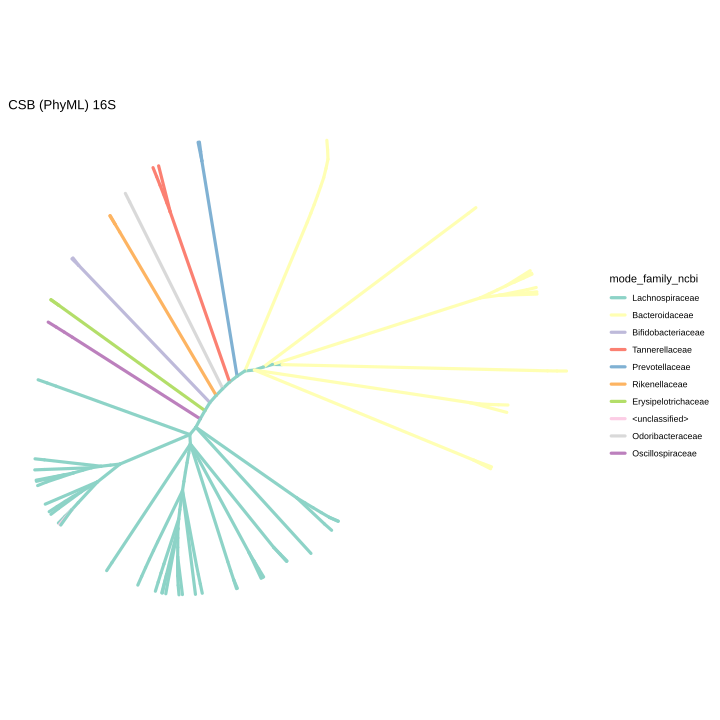

In [9]:
R"""
## read in tree and metadata
tree = read.newick(file.path($tdir_16S, "BB669_16S.phy-supporttree_multi.txt"), node.label='support')
lineagedf = read.csv(file.path($bbdir, "BB669_rowmeta.tsv"), sep="\t")
lineagedf$label = lineagedf$Strain.ID
subset_lineagedf = lineagedf[match(tree@phylo$tip.label, lineagedf$label),]
biggerfamily_ncbi = sort(table(subset_lineagedf$NCBI.Family), decreasing = TRUE)[sort(table(subset_lineagedf$NCBI.Family), decreasing = TRUE) > 0]
# labels(biggerfamily_ncbi)[[1]]
tree_withdata = as.treedata(left_join(as_tibble(tree), subset_lineagedf, by='label'))
btree_tbl = as_tibble(tree_withdata)

## Calcuate most common family desendent from each internal node of the tree
mode_family_ncbi = offspring(btree_tbl, btree_tbl$node, tiponly = FALSE, self_include = TRUE)
mode_family_ncbi = unlist(lapply(mode_family_ncbi, function(x) modeest::mfv1(x$NCBI.Family, na_rm=TRUE)))
btree_tbl$mode_family_ncbi = mode_family_ncbi
tree_withdata = as.treedata(btree_tbl)

## plot tree colored with most common family at each node
options(repr.plot.width=15, repr.plot.height=15, ignore.negative.edge=TRUE)
colorvalues = RColorBrewer::brewer.pal(12, name="Set3")
p = ggtree(tree_withdata, 
        aes(color=mode_family_ncbi, subset=support > .5), 
        layout="equal_angle", open.angle=5,
        branch.length="none", size=1.5,
    ) +
    ggtitle("CSB (PhyML) 16S") + 
    scale_color_manual(values=colorvalues, breaks=labels(biggerfamily_ncbi)[[1]]) #+theme(legend.position="none")
ggsave(file.path($pdir_16S, "CSB669_PhyML_unrooted.svg"), 
    p,
    height=10,
    width=10,
)
"""
show_svg(joinpath(pdir_16S, "CSB669_PhyML_unrooted.svg"))

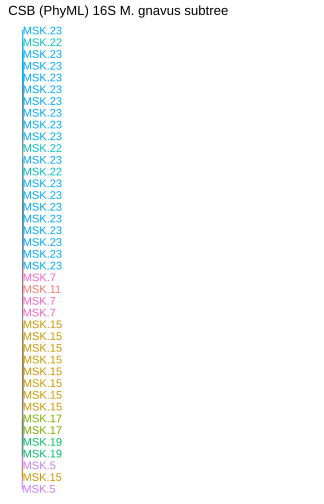

In [35]:
R"""
# plot M. gnavus subtree
colorvalues = RColorBrewer::brewer.pal(12, name="Set3")
p = ggtree(tree_subset(tree_withdata, "MSK.5.17", levels_back = 1), 
        aes(color=Donor), 
        layout="rect", open.angle=10,
    ) + 
    ggtitle("CSB (PhyML) 16S M. gnavus subtree") + 
    theme(
        legend.position = "none", 
    ) +
    xlim(0, 4) +
    geom_tiplab(aes(label=Donor))
ggsave(file.path($pdir_16S, "CSB669_PhyML_rgnavus_16S.svg"),
    p, 
    height=7,
    width=4.5,
)
""";
show_svg(joinpath(pdir_16S, "CSB669_PhyML_rgnavus_16S.svg"))

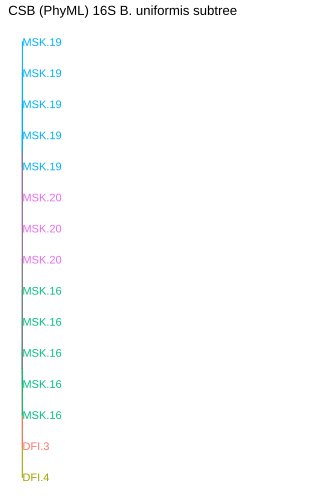

In [36]:
R"""
# plot M. gnavus subtree
colorvalues = RColorBrewer::brewer.pal(12, name="Set3")
p = ggtree(tree_subset(tree_withdata, "MSK.19.84", levels_back = 3), 
        aes(color=Donor), 
        layout="rect", open.angle=10,
    ) + 
    ggtitle("CSB (PhyML) 16S B. uniformis subtree") + 
    theme(
        legend.position = "none", 
    ) +
    xlim(0, 4) +
    geom_tiplab(aes(label=Donor))
ggsave(file.path($pdir_16S, "CSB669_PhyML_buniformis_16S.svg"),
    p, 
    height=7,
    width=4.5,
)
""";
show_svg(joinpath(pdir_16S, "CSB669_PhyML_buniformis_16S.svg"))

## Phyml on Bac120 alignment of Biobank strains

Bac120 aimed to be an improvement over 16S annotation. It takes 120 genes that are reasonably well conserved across bacteria, and takes ~50 genomic positions from each of those genes, creating an annotation of around 6000 features. 

We find that these annotations equally only work down to species level classification, with strain level replicates all being identically annotated.

In [12]:
# run(`sbatch $(projectdir("scripts", "run_phyml_csbbac120.jl"))`);

Triggers run of `scripts/run_phyml_csbbac120.jl` script on SLURM compute cluster. Has the effect of running

```
phyml -daa -mLG -fe -o tlr \
    --search SPR --r_seed 123456 --rand_start --n_rand_starts 3 \
    --no_memory_check \
    --bootstrap -4 \
    -i $PROJECTDIR/data/exp_raw/BB669/BB669_bac120.phy
```

outputting the results in `_research/BB669_bac120_phyml` 

### plot PhyML tree of Bac120 alignment

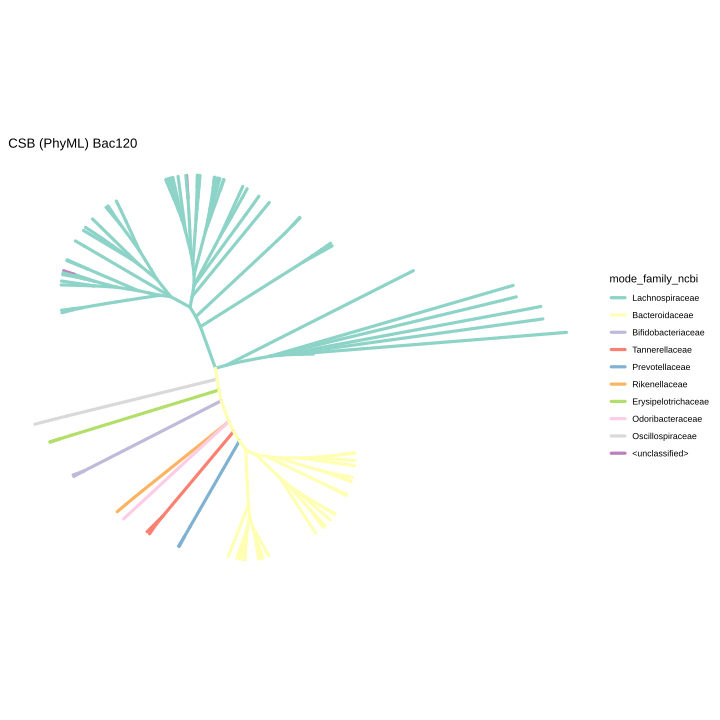

In [13]:
R"""
## read in tree and metadata
tree = read.newick(file.path($tdir_bac120, "BB669_bac120.phy-supporttree_multi.txt"), node.label='support')
lineagedf = read.csv(file.path($bbdir, "BB669_rowmeta.tsv"), sep="\t")
lineagedf$label = lineagedf$Strain.ID
subset_lineagedf = lineagedf[match(tree@phylo$tip.label, lineagedf$label),]
biggerfamily_ncbi = sort(table(subset_lineagedf$NCBI.Family), decreasing = TRUE)[sort(table(subset_lineagedf$NCBI.Family), decreasing = TRUE) > 0]
# labels(biggerfamily_ncbi)[[1]]
tree_withdata = as.treedata(left_join(as_tibble(tree), subset_lineagedf, by='label'))
btree_tbl = as_tibble(tree_withdata)

## Calcuate most common family desendent from each internal node of the tree
mode_family_ncbi = offspring(btree_tbl, btree_tbl$node, tiponly = FALSE, self_include = TRUE)
mode_family_ncbi = unlist(lapply(mode_family_ncbi, function(x) modeest::mfv1(x$NCBI.Family, na_rm=TRUE)))
btree_tbl$mode_family_ncbi = mode_family_ncbi
tree_withdata = as.treedata(btree_tbl)

## plot tree colored with most common family at each node
options(repr.plot.width=15, repr.plot.height=15, ignore.negative.edge=TRUE)
colorvalues = RColorBrewer::brewer.pal(12, name="Set3")
p = ggtree(tree_withdata, 
        aes(color=mode_family_ncbi, subset=support > .5), 
        layout="equal_angle", open.angle=5,
        branch.length="none", size=1.5,
    ) +
    ggtitle("CSB (PhyML) Bac120") + 
    scale_color_manual(values=colorvalues, breaks=labels(biggerfamily_ncbi)[[1]]) #+theme(legend.position="none")
ggsave(file.path($pdir_bac120, "CSB669_PhyML_unrooted_bac120.svg"), 
    p,
    height=10,
    width=10,
)
"""
show_svg(joinpath(pdir_bac120, "CSB669_PhyML_unrooted_bac120.svg"))

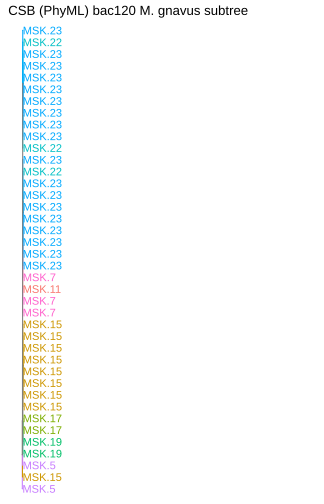

In [37]:
# plot M. gnavus subtree
R"""
colorvalues = RColorBrewer::brewer.pal(12, name="Set3")
p = ggtree(tree_subset(tree_withdata, "MSK.5.17", levels_back = 1), 
        aes(color=Donor), 
        layout="rect", open.angle=10,
    ) + 
    ggtitle("CSB (PhyML) bac120 M. gnavus subtree") + 
    theme(
        legend.position = "none", 
    ) +
    xlim(0, 4) +
    geom_tiplab(aes(label=Donor))
ggsave(file.path($pdir_16S, "CSB669_PhyML_rgnavus_bac120.svg"),
    p, 
    height=7,
    width=4.5,
)
""";
show_svg(joinpath(pdir_16S, "CSB669_PhyML_rgnavus_bac120.svg"))

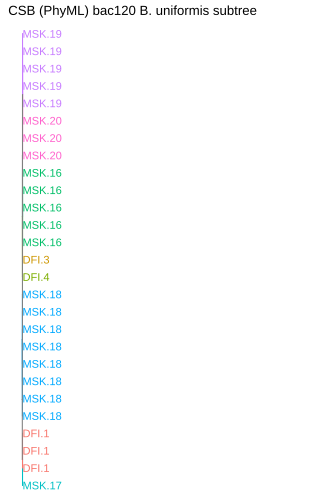

In [38]:
# plot M. gnavus subtree
R"""
colorvalues = RColorBrewer::brewer.pal(12, name="Set3")
p = ggtree(tree_subset(tree_withdata, "MSK.19.84", levels_back = 5), 
        aes(color=Donor), 
        layout="rect", open.angle=10,
    ) + 
    ggtitle("CSB (PhyML) bac120 B. uniformis subtree") + 
    theme(
        legend.position = "none", 
    ) +
    xlim(0, 4) +
    geom_tiplab(aes(label=Donor))
ggsave(file.path($pdir_16S, "CSB669_PhyML_buniformis_bac120.svg"),
    p, 
    height=7,
    width=4.5,
)
""";
show_svg(joinpath(pdir_16S, "CSB669_PhyML_buniformis_bac120.svg"))

## Constraint of metabolic capacity

In [16]:
theme(:default, grid=false, tickdir=:out, label=false)
pdir_met = plotsdir("metabolite_strainvariation") |> mkpath

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_strainvariation"

In [17]:
metmtx = biobank["metabolites_foldchange"].X[:, :]

# too close to zero for detectable measurment, so assume no change
metmtx[isinf.(metmtx)] .= 0.0; 
@show size(metmtx)

# # filter to metabolites that have at least 10% detectable shifts in measurement
# metabolite_names_full = biobank["metabolites_foldchange"].var_names.vals;
# keepmetabolites_mask = mapslices(c->mean(c .== 0.0) < 0.9, metmtx, dims=1) |> vec;
# metabolite_names = metabolite_names_full[keepmetabolites_mask]
# metmtx = metmtx[:, keepmetabolites_mask];
# @show size(metmtx);

size(metmtx) = (669, 50)


(669, 50)

In [18]:
Mij = pairwise(Euclidean(), metmtx, dims=1)
uptri = triu(trues(size(Mij)), 1);
issamespecies = uptri .&& (biobank.obs.NCBI_Species .== permutedims(biobank.obs.NCBI_Species));

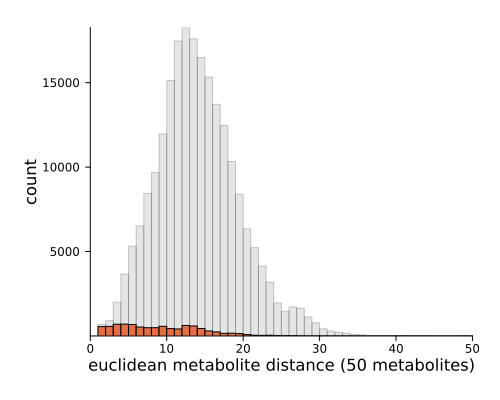

In [19]:
plot(    
    yticks=[5000, 10000, 15000],
size=(500, 400),
margin=5Plots.mm,
xlabel="euclidean metabolite distance (50 metabolites)",
ylabel="count",
xlims=(0,50),)
histogram!(Mij[uptri], bins=1:1:50, alpha=0.2, color=:grey)
histogram!(Mij[issamespecies], bins=1:1:50)

In [20]:
savefig(joinpath(pdir_met, "histogram_strain_metabolite_distances.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_strainvariation/histogram_strain_metabolite_distances.pdf"

# Fig. S1 - Metabolite variablilty 

However, these strains are not functionally identical. Strains of the same species, digest/produce different amounts of metabolite compounds. And it is not simply individual variation. In the plot below we see bi-modal distribution indicating that there are groups of strains that behave differently.

In [21]:
theme(:default, grid=false, tickdir=:out, label=false)
pdir_met = plotsdir("metabolite_strainvariation") |> mkpath

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_strainvariation"

In [22]:
# load metabolites matrix
metmtx = biobank["metabolites_foldchange"].X[:, :][biobank.obs.kept_species,:];

# too close to zero for detectable measurment, so assume no change
metmtx[isinf.(metmtx)] .= 0.0; 
@show size(metmtx)

# filter to metabolites that have at least 10% detectable shifts in measurement
metabolite_names_full = biobank["metabolites_foldchange"].var_names.vals;
keepmetabolites_mask = mapslices(c->mean(c .== 0.0) < 0.9, metmtx, dims=1) |> vec;
metabolite_names = metabolite_names_full[keepmetabolites_mask]
metmtx = metmtx[:, keepmetabolites_mask];
@show size(metmtx);

size(metmtx) = (356, 50)
size(metmtx) = (356, 32)


In [23]:
speciescolors = CSV.read(datadir("exp_raw", "BB669", "subsettreecolors.csv"), DataFrame);
metabolitelabels = biobank["metabolites_foldchange"].var.label;

In [24]:
metbbobs = bbobs[biobank.obs.kept_species, :];

In [25]:
metabolite_species = sort(countmap(metbbobs.Species), byvalue=true, rev=true)

OrderedCollections.OrderedDict{String, Int64} with 11 entries:
  "Phocaeicola vulgatus"         => 88
  "[Ruminococcus] gnavus"        => 41
  "Bacteroides thetaiotaomicron" => 35
  "Anaerostipes hadrus"          => 31
  "Bacteroides uniformis"        => 27
  "Blautia luti"                 => 24
  "Bifidobacterium breve"        => 24
  "Coprococcus comes"            => 23
  "Dorea formicigenerans"        => 22
  "Blautia wexlerae"             => 21
  "[Eubacterium] rectale"        => 20

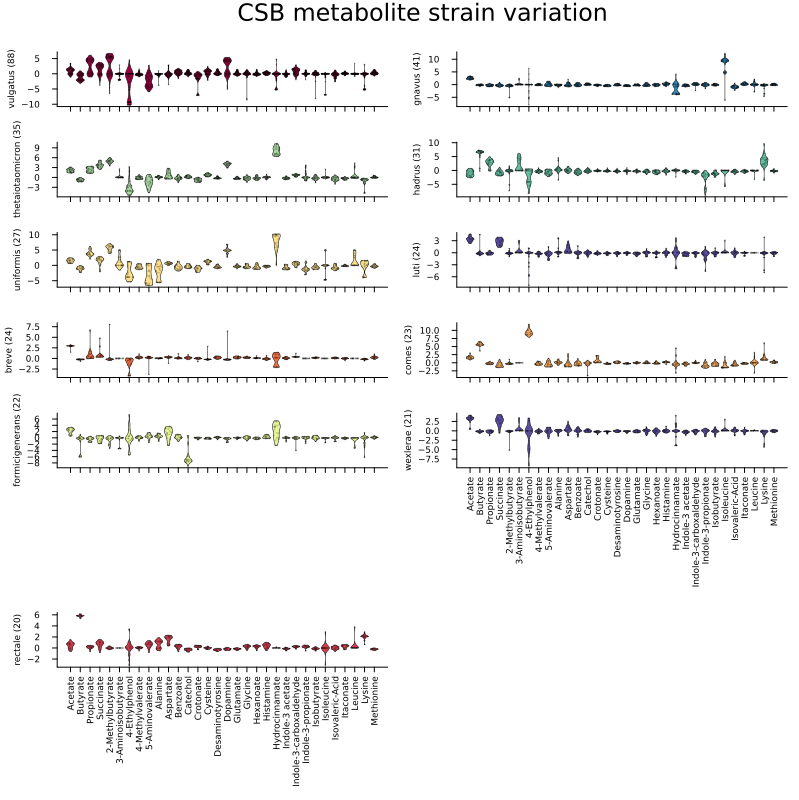

In [26]:
#| code-fold: true
#| code-summary: show plotting code
#| fig-cap: show log-2 fold change from base media across strains from 9 species with more than 20 replicates. multi-modal distributions for some distributions indicates sub-species phylogentic variation in phenotype.

ps = []
for (i, species) in enumerate(keys(metabolite_species))
    speciesmask = occursin.(species, metbbobs.Species)
    p = violin(permutedims(1:size(metmtx, 2)),
        metmtx[speciesmask, :],
        ylabel="$(last(split(species," "))) ($(metabolite_species[species]))",
        c=speciescolors.color[findfirst(==(species), speciescolors.species_name)],
        xticks= i>=10 ? (1:size(metmtx, 2), metabolitelabels) : (1:size(metmtx, 2), repeat([""], size(metmtx, 2))),
        xrotation=90,
    )
    dotplot!(permutedims(1:size(metmtx, 2)),
        metmtx[speciesmask, :], 
        c=:black, alpha=.2, markerstrokewidth=0, markersize=1,
        # side=:right
    )
    push!(ps, p)
end

plot(ps..., 
    layout=grid(ceil(Int, length(metabolite_species)/2), 2), 
    plot_title = "CSB metabolite strain variation",
    size=(800, 800),
    tickdirection=:out,
    labelfontsize=6,
    tickfontsize=6,
    lw=.5,
    markersize=1
)

In [27]:
savefig(joinpath(pdir_met, "violinplots_32metabolites_strainlevel_variation.pdf"))

"/Users/bend/projects/Doran_etal_2023/plots/metabolite_strainvariation/violinplots_32metabolites_strainlevel_variation.pdf"